In [1]:
%run gradients
%run representation_analysis
%run read_experiments


# Auxiliary Task Gradients

## Data Collection

### Numerical

In [ ]:
collect_batch = 128
collect_processes = 4

"""Set up storage object
"""
batch_sizes = [16, 32]
aux_tasks = ['wall0', 'wall1', 'wall01', 'goaldist', 'terminal']
trials = range(3)
all_chks = [[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900, 950, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800],
            [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900]]


all_res = {}

for i, batch in enumerate(batch_sizes):
    all_res[batch] = {}
    for aux in aux_tasks:
        all_res[batch][aux] = {}
        for trial in trials:
            all_res[batch][aux][trial] = {}
            
            

for i, batch in enumerate(batch_sizes):
    for aux in aux_tasks:
        for trial in trials:
            exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
            exp_name_t = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}_t{trial}'
            
            _, _, env_kwargs = load_model_and_env(exp_name, 0)
            chk_path = Path('../trained_models/checkpoint/')/exp_name_t
            chks = all_chks[i]
            

            #Load first checkpoint and warm up reward normalization
            model, obs_rms = torch.load(chk_path/f'{chks[0]}.pt')
            agent, envs, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                                    num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                                          agent_base='DecomposeGradPPO')
            obs = storage.obs[0].clone()
            res = collect_batches_and_grads(agent, envs, storage, 50, decompose_grads=True)


            cs_means = []
            for chk in tqdm(chks):
                model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                obs = storage.obs[-1].clone()
                envs.venv.obs_rms = obs_rms
                agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                                        num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                                        make_env=False, obs=obs, agent_base='DecomposeGradPPO')


                res = collect_batches_and_grads(agent, envs, storage, num_batches=20,
                                                data_callback=nav_data_callback, decompose_grads=True)
                all_res[batch][aux][trial][chk] = res

        pickle.dump(all_res, open(f'data/grads/new_auxpred2_grads', 'wb'))


### Categorical

In [32]:
collect_batch = 128
collect_processes = 4

"""Set up storage object
"""
batch_sizes = [16, 32]
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
auxiliary_truth_sizes = [[1], [1], [1, 1],  [1], [1]]
trials = range(3)
all_chks = {16: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900, 950, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800],
            32: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900]}


all_res = {}

for i, batch in enumerate(batch_sizes):
    all_res[batch] = {}
    for aux in aux_tasks:
        all_res[batch][aux] = {}
        for trial in trials:
            all_res[batch][aux][trial] = {}
            
            

for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        for trial in trials:
            exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'
            exp_name_t = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}_t{trial}'
            
            # _, _, env_kwargs = load_model_and_env(exp_name, 0)
            env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
            chk_path = Path('../trained_models/checkpoint/')/exp_name_t
            chks = all_chks[batch]
            

            #Load first checkpoint and warm up reward normalization
            model, obs_rms = torch.load(chk_path/f'{chks[0]}.pt')
            agent, envs, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                                    num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                                          agent_base='DecomposeGradPPOAux', new_aux=True,
                                                           auxiliary_truth_sizes=auxiliary_truth_sizes[j])
            obs = storage.obs[0].clone()
            res = collect_batches_and_grads(agent, envs, storage, 50, decompose_grads=True, new_aux=True)


            cs_means = []
            for chk in tqdm(chks):
                model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                obs = storage.obs[-1].clone()
                envs.venv.obs_rms = obs_rms
                agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                                        num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                                        make_env=False, obs=obs, agent_base='DecomposeGradPPOAux', new_aux=True, 
                                                            auxiliary_truth_sizes=auxiliary_truth_sizes[j])


                res = collect_batches_and_grads(agent, envs, storage, num_batches=20,
                                                data_callback=nav_data_callback, decompose_grads=True,
                                                new_aux=True)
                all_res[batch][aux][trial][chk] = res
                
            

        pickle.dump(all_res, open(f'data/grads/auxcat_grads', 'wb'))


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [05:11<00:00,  8.91s/it]


### Cosine Similarity Computation

In [2]:
all_res = pickle.load(open(f'data/grads/auxcat_grads', 'rb'))

In [3]:
batch_sizes = [16, 32]
trials = range(3)

all_chks = {16: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900, 950, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800],
            32: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900]}
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']

all_xs = defaultdict(dict)
all_ys = defaultdict(dict)

all_batch_ordered_cs = {}


for i, batch in enumerate(tqdm(batch_sizes)):
    all_batch_ordered_cs[batch] = {}
    for j, aux in enumerate(aux_tasks):
        all_batch_ordered_cs[batch][aux] = {}
        xs = []
        ys = []

        for trial in trials:
            all_batch_ordered_cs[batch][aux][trial] = {}
            chk_res = all_res[batch][aux][trial]
            chks = all_chks[batch]
            
            x = []
            y = []

            for _, chk in enumerate(chks):
                res = chk_res[chk]
                # cs = cos_sim_grad(res['all_grads_bonus'], res['all_grads_pure_bonus'], pairwise=False)    
                # batch_ordered_cs = np.array(cs).reshape(len(res['all_grads_goal']), -1).mean(axis=0)
                
                # Using only actor layers
                # cs = aux_cos_sim_grad(res['all_grads'])
                
                #Using only shared layers
                cs = aux_cos_sim_grad(res['all_grads'], use_layer_subset=[0, 1, 2, 3, 6, 7, 10, 11])
                # batch_ordered_cs = np.array(cs).reshape(4, -1).mean(axis=0)
                
                x.append(chk)
                y.append(np.mean(cs))
                all_batch_ordered_cs[batch][aux][trial][chk] = list(cs)
                
            xs.append(x)
            ys.append(y)
        
        all_xs[batch][aux] = xs
        all_ys[batch][aux] = ys

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:31<00:00, 15.65s/it]


## Analysis

### Categorical

#### Which Layers to use?

* Only shared layers (0, 1)
* Only actor layers (6, 10)
* Both (0, 1, 6, 10)

We know that the sets of gradients are somewhat uncorrelated, but want to see overall what do gradient cos sims look like under these conditions

#### Focus on a segment of training?

Maybe we want to just focus on the gradient signals when 

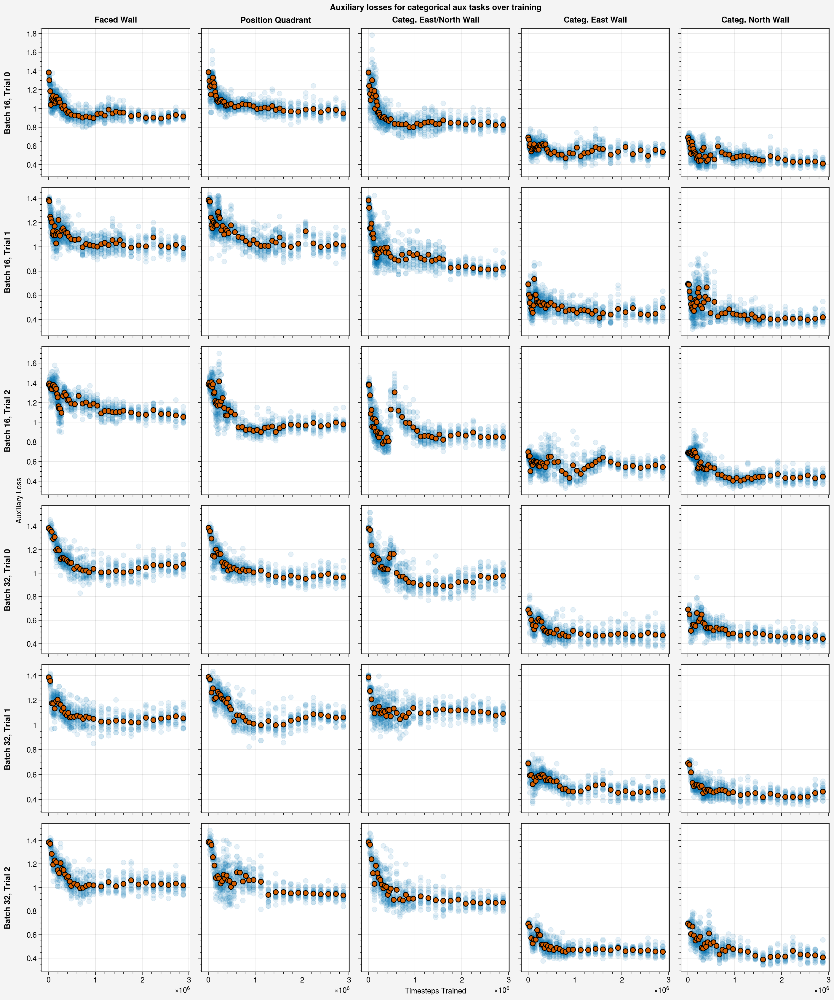

In [24]:
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

num_trials = 3
fig, ax = pplt.subplots(nrows=len(batch_sizes)*num_trials, ncols=len(aux_tasks))

for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        chks = all_chks[batch]
        for trial in range(num_trials):
            x = []
            y = []
            x_means = []
            y_means = []
            for chk in chks:
                losses = all_res[batch][aux][trial][chk]['auxiliary_losses']
                timestep = chk*batch*100
                x += [timestep]*len(losses)
                y += losses
                x_means.append(timestep)
                y_means.append(np.mean(losses))
                
            ax[i*num_trials+trial, j].scatter(x, y, alpha=0.1)
            scatters = [ax[i*num_trials+trial, j].scatter(x_means, y_means, edgecolor='black', linewidth=1,
                        label='mean')]
            
leftlabels = []
for i, batch in enumerate(batch_sizes):
    for trial in range(num_trials):
        leftlabels.append(f'Batch {batch}, Trial {trial}')
ax.format(toplabels=aux_labels, leftlabels=leftlabels, xlabel='Timesteps Trained',
         ylabel='Auxiliary Loss', suptitle='Auxiliary losses for categorical aux tasks over training')


In [25]:
all_res[16]['catfacewall'][0][0].keys()

dict_keys(['all_grads', 'rewarded', 'value_losses', 'action_losses', 'auxiliary_losses', 'rewards', 'value_diff', 'data'])

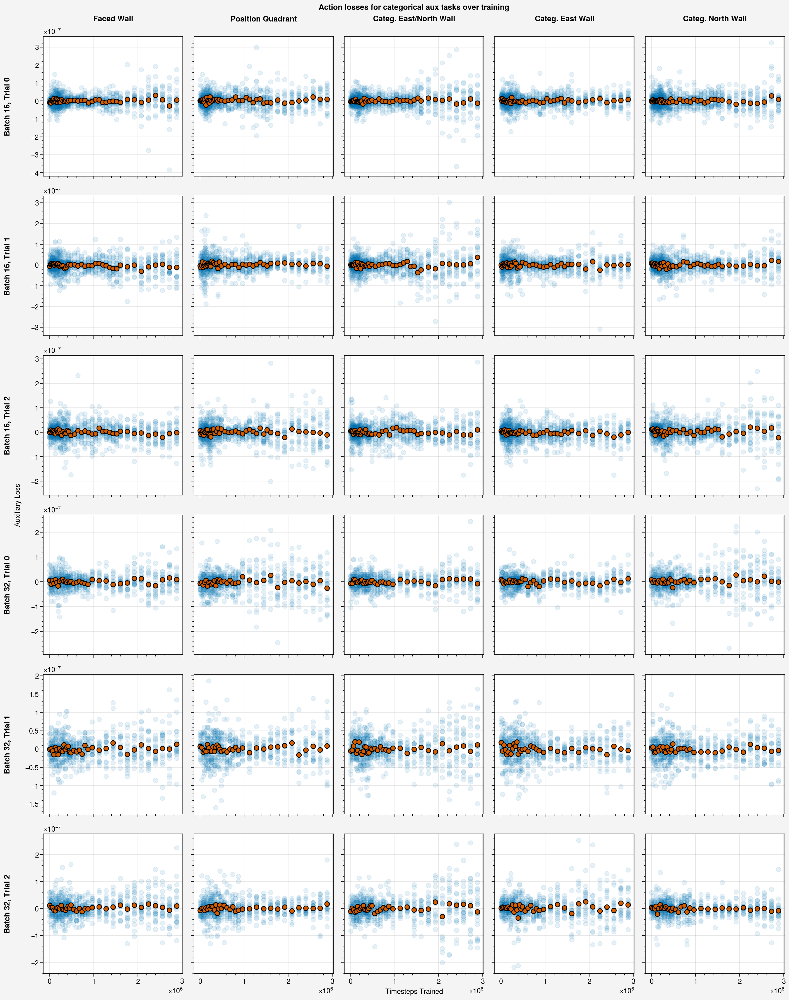

In [26]:
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

num_trials = 3
fig, ax = pplt.subplots(nrows=len(batch_sizes)*num_trials, ncols=len(aux_tasks))

for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        chks = all_chks[batch]
        for trial in range(num_trials):
            x = []
            y = []
            x_means = []
            y_means = []
            for chk in chks:
                losses = all_res[batch][aux][trial][chk]['action_losses']
                timestep = chk*batch*100
                x += [timestep]*len(losses)
                y += losses
                x_means.append(timestep)
                y_means.append(np.mean(losses))
                
            ax[i*num_trials+trial, j].scatter(x, y, alpha=0.1)
            scatters = [ax[i*num_trials+trial, j].scatter(x_means, y_means, edgecolor='black', linewidth=1,
                        label='mean')]
            
leftlabels = []
for i, batch in enumerate(batch_sizes):
    for trial in range(num_trials):
        leftlabels.append(f'Batch {batch}, Trial {trial}')
ax.format(toplabels=aux_labels, leftlabels=leftlabels, xlabel='Timesteps Trained',
         ylabel='Auxiliary Loss', suptitle='Action losses for categorical aux tasks over training')


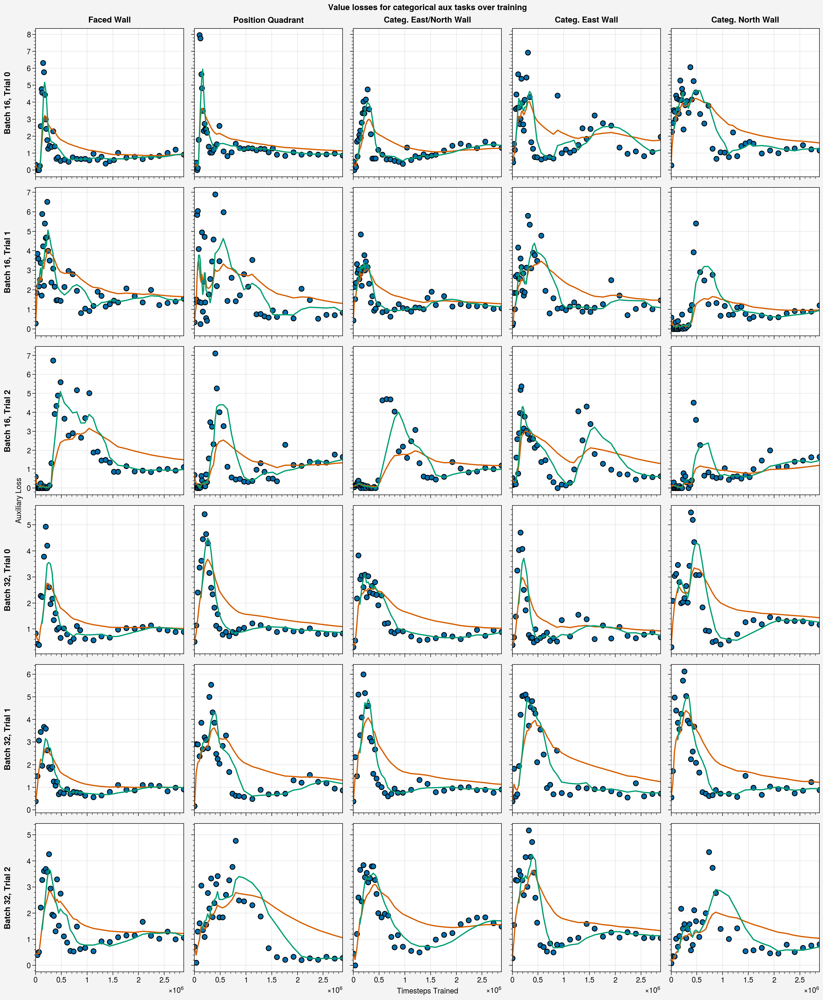

In [40]:
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

num_trials = 3
fig, ax = pplt.subplots(nrows=len(batch_sizes)*num_trials, ncols=len(aux_tasks))

for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        chks = all_chks[batch]
        for trial in range(num_trials):
            x = []
            y = []
            x_means = []
            y_means = []
            for chk in chks:
                losses = all_res[batch][aux][trial][chk]['value_losses']
                timestep = chk*batch*100
                x += [timestep]*len(losses)
                y += losses
                x_means.append(timestep)
                y_means.append(np.mean(losses))
                
            # ax[i*num_trials+trial, j].scatter(x, y, alpha=0.1)
            scatters = [ax[i*num_trials+trial, j].scatter(x_means, y_means, edgecolor='black', linewidth=1,
                        label='mean')]
            ax[i*num_trials+trial, j].plot(x_means, pd.Series(y_means).ewm(alpha=0.1).mean())
            ax[i*num_trials+trial, j].plot(x_means, pd.Series(y_means).rolling(5).mean())
            
leftlabels = []
for i, batch in enumerate(batch_sizes):
    for trial in range(num_trials):
        leftlabels.append(f'Batch {batch}, Trial {trial}')
ax.format(toplabels=aux_labels, leftlabels=leftlabels, xlabel='Timesteps Trained',
         ylabel='Auxiliary Loss', suptitle='Value losses for categorical aux tasks over training')


In [47]:

loss_types = ['action_losses', 'value_losses', 'auxiliary_losses']
loss_normalizations = {}
#Generate normalizations for each loss type, across auxiliary tasks
for aux in aux_tasks:
    loss_normalizations[aux] = {}
    for loss in loss_types:
        min_loss = np.inf
        max_loss = -np.inf
        for batch in batch_sizes:
            chks = all_chks[batch]
            for trial in range(num_trials):
                for chk in chks:
                    min_loss = min(min_loss, np.min(all_res[batch][aux][trial][chk][loss]))
                    max_loss = max(max_loss, np.max(all_res[batch][aux][trial][chk][loss]))
        loss_normalizations[aux][loss] = [min_loss, max_loss]

####

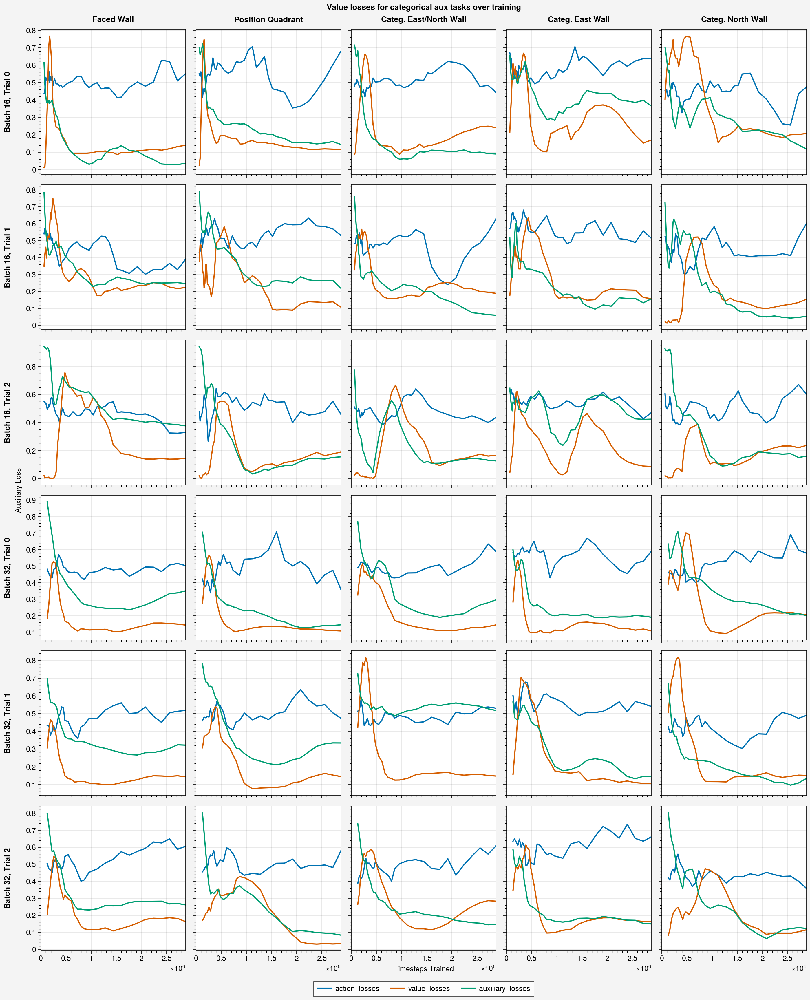

In [59]:
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

num_trials = 3
fig, ax = pplt.subplots(nrows=len(batch_sizes)*num_trials, ncols=len(aux_tasks))

loss_types = ['action_losses', 'value_losses', 'auxiliary_losses']
loss_normalizations = {}
#Generate normalizations for each loss type, across auxiliary tasks
for aux in aux_tasks:
    loss_normalizations[aux] = {}
    for loss in loss_types:
        min_loss = np.inf
        max_loss = -np.inf
        for batch in batch_sizes:
            chks = all_chks[batch]
            for trial in range(num_trials):
                for chk in chks:
                    min_loss = min(min_loss, np.mean(all_res[batch][aux][trial][chk][loss]))
                    max_loss = max(max_loss, np.mean(all_res[batch][aux][trial][chk][loss]))
        loss_normalizations[aux][loss] = [min_loss, max_loss]
    
    
for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        chks = all_chks[batch]
        for trial in range(num_trials):
            lines = []
            for loss in loss_types:
                x_means = []
                y_means = []
                for chk in chks:
                    losses = all_res[batch][aux][trial][chk][loss]
                    timestep = chk*batch*100
                    x_means.append(timestep)
                    y_means.append(np.mean(losses))

                #scale losses using earlier normalization
                norm = loss_normalizations[aux][loss]
                y_means = np.array(y_means)
                y_means = (y_means - norm[0])/(norm[1]-norm[0])
                
                # ax[i*num_trials+trial, j].plot(x_means, pd.Series(y_means).ewm(alpha=0.1).mean())
                lines.append(ax[i*num_trials+trial, j].plot(x_means, pd.Series(y_means).rolling(5).mean(), label=loss))
            
leftlabels = []
for i, batch in enumerate(batch_sizes):
    for trial in range(num_trials):
        leftlabels.append(f'Batch {batch}, Trial {trial}')
ax.format(toplabels=aux_labels, leftlabels=leftlabels, xlabel='Timesteps Trained',
         ylabel='Auxiliary Loss', suptitle='Value losses for categorical aux tasks over training')
fig.legend(lines, labels=loss_types, loc='b')
print('')

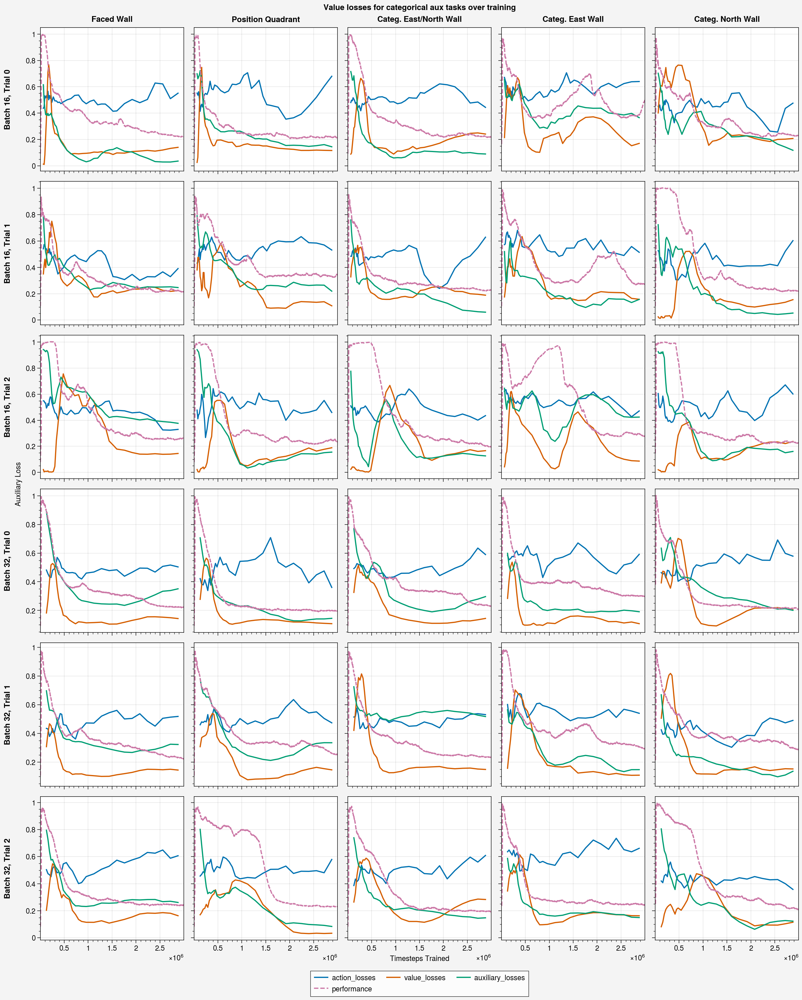

In [69]:
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

num_trials = 3
fig, ax = pplt.subplots(nrows=len(batch_sizes)*num_trials, ncols=len(aux_tasks))

loss_types = ['action_losses', 'value_losses', 'auxiliary_losses']
loss_normalizations = {}
#Generate normalizations for each loss type, across auxiliary tasks
for aux in aux_tasks:
    loss_normalizations[aux] = {}
    for loss in loss_types:
        min_loss = np.inf
        max_loss = -np.inf
        for batch in batch_sizes:
            chks = all_chks[batch]
            for trial in range(num_trials):
                for chk in chks:
                    min_loss = min(min_loss, np.mean(all_res[batch][aux][trial][chk][loss]))
                    max_loss = max(max_loss, np.mean(all_res[batch][aux][trial][chk][loss]))
        loss_normalizations[aux][loss] = [min_loss, max_loss]
    
    
for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'
        xs, ys, min_x, max_x = average_runs(exp_name, 'length', ignore_first=100, ewm=0.001, ret=True)
        
        chks = all_chks[batch]
        for trial in range(num_trials):
            lines = []
            for loss in loss_types:
                x_means = []
                y_means = []
                for chk in chks:
                    losses = all_res[batch][aux][trial][chk][loss]
                    timestep = chk*batch*100
                    x_means.append(timestep)
                    y_means.append(np.mean(losses))

                #scale losses using earlier normalization
                norm = loss_normalizations[aux][loss]
                y_means = np.array(y_means)
                y_means = (y_means - norm[0])/(norm[1]-norm[0])
                
                # ax[i*num_trials+trial, j].plot(x_means, pd.Series(y_means).ewm(alpha=0.1).mean())
                lines.append(ax[i*num_trials+trial, j].plot(x_means, pd.Series(y_means).rolling(5).mean(), label=loss))
                
            
            lines.append(ax[i*num_trials+trial, j].plot(xs, ys[trial]/200, linestyle='--', label='performance'))
leftlabels = []
for i, batch in enumerate(batch_sizes):
    for trial in range(num_trials):
        leftlabels.append(f'Batch {batch}, Trial {trial}')
ax.format(toplabels=aux_labels, leftlabels=leftlabels, xlabel='Timesteps Trained',
         ylabel='Auxiliary Loss', suptitle='Value losses for categorical aux tasks over training')
fig.legend(lines, labels=loss_types+['performance'], loc='b')
print('')

#### Side question: which grad most strongly influences

In [191]:
batch = 32
aux = 'catfacewall'
trial = 1
chk = 100
grads = all_res[batch][aux][trial][chk]['all_grads']
#Compute combined RL gradient vectors
comb_grad = [[] for i in range(len(grads['value']))]
for layer in range(len(grads['value'])):
    for n in range(len(grads['value'][layer])):
        comb_grad[layer].append(torch.zeros(grads['value'][layer][n].shape))

for layer in range(len(grads['value'])):
    for n in range(len(grads['value'][layer])):
        for grad_type in ['action', 'value', 'entropy']:
            comb_grad[layer][n] += grads[grad_type][layer][n]

In [192]:
grads['auxiliary'][0][0]

tensor([[-1.1592e-04, -8.2742e-05, -7.6552e-05,  ..., -5.0186e-05,
         -4.3206e-05, -3.9886e-05],
        [-5.3122e-05, -4.9938e-05, -4.5935e-05,  ..., -2.5275e-04,
         -2.4975e-04, -2.1183e-04],
        [ 2.7923e-05,  2.6721e-05,  2.3697e-05,  ..., -5.1650e-04,
         -4.7190e-04, -4.1901e-04],
        ...,
        [ 1.5054e-03,  1.9476e-03,  1.8534e-03,  ..., -8.9747e-04,
          1.5084e-03,  3.7385e-03],
        [ 2.4259e-03,  2.0529e-03,  1.8440e-03,  ..., -3.2503e-03,
         -5.7401e-03, -6.9172e-03],
        [ 1.8109e-03,  1.6236e-03,  1.4728e-03,  ..., -1.2723e-03,
         -2.9621e-03, -4.3567e-03]])

In [193]:
grads['entropy'][0][0]

tensor([[-0.0022, -0.0008, -0.0007,  ..., -0.0014, -0.0008, -0.0004],
        [ 0.0006,  0.0004,  0.0004,  ...,  0.0020,  0.0025,  0.0028],
        [ 0.0006,  0.0005,  0.0005,  ...,  0.0003, -0.0002, -0.0005],
        ...,
        [-0.0353, -0.0310, -0.0295,  ...,  0.0936,  0.0952,  0.0992],
        [ 0.0523,  0.0411,  0.0388,  ..., -0.0569, -0.0788, -0.0928],
        [ 0.0370,  0.0316,  0.0287,  ..., -0.0144, -0.0195, -0.0251]])

In [194]:
grads['value'][0][0]

tensor([[-2.1710e-03, -8.0298e-04, -6.8598e-04,  ..., -2.1628e-03,
         -1.1463e-03, -2.1848e-04],
        [-7.0117e-04, -7.4341e-04, -6.5592e-04,  ..., -1.2265e-04,
          1.1507e-03,  2.6424e-03],
        [ 6.2281e-04,  5.7622e-04,  5.2418e-04,  ...,  1.0483e-03,
          4.4169e-04, -8.6180e-05],
        ...,
        [-3.2892e-02, -2.8010e-02, -2.7102e-02,  ...,  8.5214e-02,
          9.3900e-02,  1.0749e-01],
        [ 4.5558e-02,  3.3748e-02,  3.2105e-02,  ..., -5.7047e-02,
         -8.8698e-02, -1.1550e-01],
        [ 2.7179e-02,  2.2491e-02,  2.0375e-02,  ..., -1.1566e-02,
         -1.9973e-02, -2.9703e-02]])

In [195]:
grads['action'][0][0]

tensor([[-1.9293e-05,  4.0566e-05,  3.8210e-05,  ..., -7.4689e-04,
         -3.2810e-04,  2.1880e-04],
        [-1.2672e-03, -1.1620e-03, -1.0606e-03,  ..., -2.1448e-03,
         -1.3731e-03, -1.9101e-04],
        [ 3.6576e-05,  3.3437e-05,  3.0964e-05,  ...,  7.5003e-04,
          6.6001e-04,  3.8331e-04],
        ...,
        [ 2.4559e-03,  2.9765e-03,  2.3966e-03,  ..., -8.3804e-03,
         -1.2542e-03,  8.3349e-03],
        [-6.7847e-03, -7.3097e-03, -6.7194e-03,  ..., -9.7912e-05,
         -9.9394e-03, -2.2743e-02],
        [-9.7962e-03, -9.1032e-03, -8.3528e-03,  ...,  2.8129e-03,
         -4.3817e-04, -4.5664e-03]])

In [196]:
grads['action'][0][0] + grads['entropy'][0][0]

tensor([[-2.1710e-03, -8.0298e-04, -6.8598e-04,  ..., -2.1628e-03,
         -1.1463e-03, -2.1848e-04],
        [-7.0117e-04, -7.4341e-04, -6.5592e-04,  ..., -1.2265e-04,
          1.1507e-03,  2.6424e-03],
        [ 6.2281e-04,  5.7622e-04,  5.2418e-04,  ...,  1.0483e-03,
          4.4169e-04, -8.6180e-05],
        ...,
        [-3.2892e-02, -2.8010e-02, -2.7102e-02,  ...,  8.5214e-02,
          9.3900e-02,  1.0749e-01],
        [ 4.5558e-02,  3.3748e-02,  3.2105e-02,  ..., -5.7047e-02,
         -8.8698e-02, -1.1550e-01],
        [ 2.7179e-02,  2.2491e-02,  2.0375e-02,  ..., -1.1566e-02,
         -1.9973e-02, -2.9703e-02]])

In [170]:
comb_grad = [[] for i in range(len(grads['value']))]
for layer in range(len(grads['value'])):
    for n in range(len(grads['value'][layer])):
        comb_grad[layer].append(torch.zeros(grads['value'][layer][n].shape))

for layer in range(len(grads['value'])):
    for n in range(len(grads['value'][layer])):
        for grad_type in ['action', 'value', 'entropy']:
            comb_grad[layer][n] += grads[grad_type][layer][n]

In [175]:
batch

32

In [176]:
aux

'catwall1'

In [177]:
trial

2

In [178]:
chk

900

In [174]:
grads['entropy'][0][0] + grads['action'][0][0] - grads['value'][0][0]

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [173]:
grads['value'][0][0]

tensor([[-0.0010, -0.0003, -0.0010,  ...,  0.0017,  0.0013,  0.0003],
        [ 0.0018,  0.0017,  0.0016,  ..., -0.0044, -0.0062, -0.0070],
        [ 0.0004,  0.0004,  0.0004,  ...,  0.0007,  0.0003,  0.0003],
        ...,
        [ 0.0250,  0.0231,  0.0217,  ..., -0.0208, -0.0105,  0.0116],
        [-0.0206, -0.0193, -0.0178,  ...,  0.0388,  0.0054, -0.0459],
        [-0.0137, -0.0151, -0.0062,  ..., -0.0176, -0.0183, -0.0190]])

In [156]:
n

0

In [152]:
comb_grad

[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]

In [149]:
comb_grad[0][0]

tensor([[-0.0010, -0.0003, -0.0010,  ...,  0.0017,  0.0013,  0.0003],
        [ 0.0018,  0.0017,  0.0016,  ..., -0.0044, -0.0062, -0.0070],
        [ 0.0004,  0.0004,  0.0004,  ...,  0.0007,  0.0003,  0.0003],
        ...,
        [ 0.0250,  0.0231,  0.0217,  ..., -0.0208, -0.0105,  0.0116],
        [-0.0206, -0.0193, -0.0178,  ...,  0.0388,  0.0054, -0.0459],
        [-0.0137, -0.0151, -0.0062,  ..., -0.0176, -0.0183, -0.0190]])

In [199]:
#Compute all combined RL gradient vectors for all_res

for batch in batch_sizes:
    chks = all_chks[batch]
    for aux in tqdm(aux_tasks):
        for trial in range(num_trials):
            for chk in chks:
                grads = all_res[batch][aux][trial][chk]['all_grads']
                #Compute combined RL gradient vectors
            comb_grad = [[] for i in range(len(grads['value']))]
            for layer in range(len(grads['value'])):
                for n in range(len(grads['value'][layer])):
                    comb_grad[layer].append(torch.zeros(grads['value'][layer][n].shape))

            for layer in range(len(grads['value'])):
                for n in range(len(grads['value'][layer])):
                    for grad_type in ['action', 'value', 'entropy']:
                        comb_grad[layer][n] += grads[grad_type][layer][n]                
                all_res[batch][aux][trial][chk]['all_grads']['rl'] = comb_grad

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 73.83it/s]


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:44<00:00, 14.91s/it]


TypeError: Unexpected keyword argument(s): {'top_labels': ['Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']}

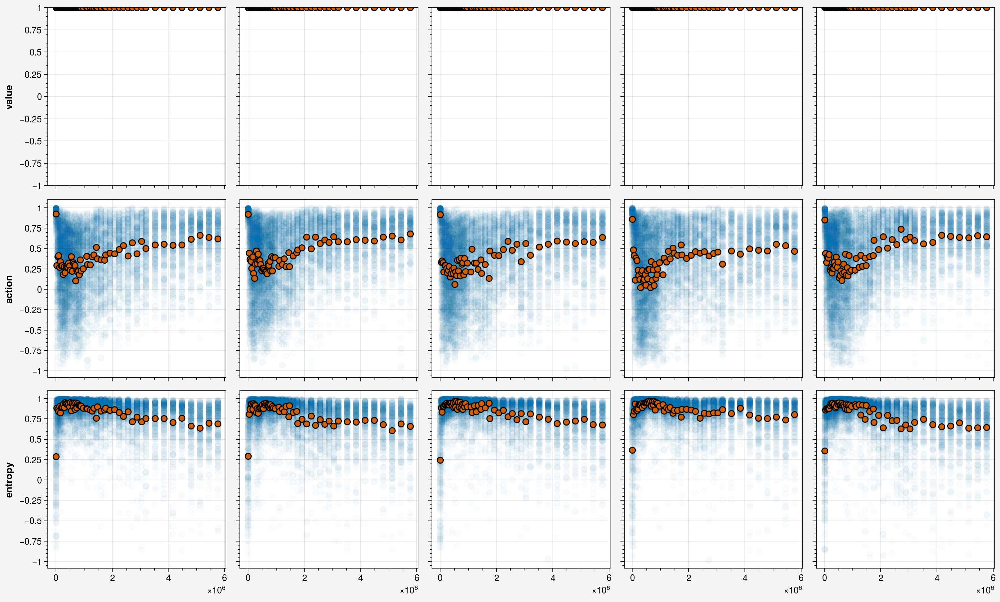

In [116]:
fig, ax = pplt.subplots(nrows=3, ncols=len(aux_tasks))

rl_grad_types = ['value', 'action', 'entropy']

use_layers = [0, 1]
for j, aux in enumerate(aux_tasks):
    for i, plot_grad_type in enumerate(tqdm(rl_grad_types)):

        xs = []
        ys = []

        for batch in batch_sizes:
            chks = all_chks[batch]

            for chk in chks:
                for trial in range(num_trials):
                    grads = all_res[batch][aux][trial][chk]['all_grads']
                    comb_grad = grads['rl']
                    #Compute similarity with each individual gradient type
                    cs = np.array(cos_sim_grad(grads[plot_grad_type], comb_grad, pairwise=False)).reshape(-1, 20)
                    filt_cs = list(cs[use_layers].reshape(-1))
                    ys += filt_cs
                    xs += [chk*batch*200]*len(filt_cs)
                    
        #calculate means across training
        x_means = []
        y_means = []
        ys = np.array(ys)
        for x in np.unique(xs):
            x_means.append(x)
            y_means.append(np.mean(ys[xs == x]))
                    
        ax[i, j].scatter(xs, ys, alpha=0.02)
        scatters = [ax[i, j].scatter(x_means, y_means, edgecolor='black', linewidth=1,
                    label='mean')]


ax.format(leftlabels=rl_grad_types, toplabels=aux_labels,
          ylim=[-1, 1])    

In [120]:
len(grads['rl'])

18

In [299]:
optimizer

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    eps: 1e-05
    foreach: None
    lr: 0.0007
    maximize: False
    weight_decay: 0
)

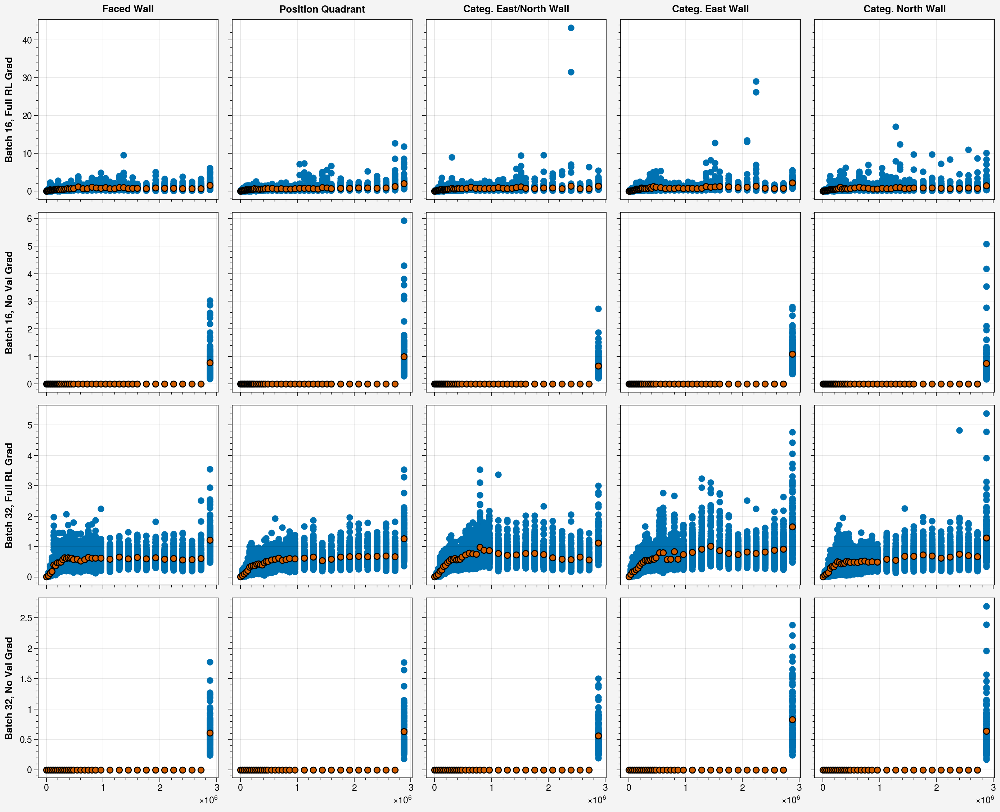

In [202]:
fig, ax = pplt.subplots(nrows=2*2, ncols=len(aux_tasks))

layers = [0, 1]
num_batches = 20

leftlabels = []

for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        xs = []
        ys_rl = []
        ys_noval = []
    
        for trial in range(num_trials):
            chks = all_chks[batch]
            for chk in chks:
                grads = all_res[batch][aux][trial][chk]['all_grads']
                for layer in layers:
                    for n in range(num_batches):
                        rl_grad = grads['rl'][layer][n]
                        val_grad = grads['value'][layer][n]
                        
                        xs.append(chk*batch*100)
                        ys_rl.append(torch.norm(rl_grad).item())
                        ys_noval.append(torch.norm(rl_grad - val_grad).item())
        
        ax[i*2, j].scatter(xs, ys_rl)
        ax[i*2+1, j].scatter(xs, ys_noval)        
        
        ys_rl = np.array(ys_rl)
        ys_noval = np.array(ys_noval)
        x_means = []
        y_means_rl = []
        y_means_noval = []
        ys = np.array(ys)
        for x in np.unique(xs):
            x_means.append(x)
            y_means_rl.append(np.mean(ys_rl[xs == x]))
            y_means_noval.append(np.mean(ys_noval[xs == x]))
            
        ax[i*2, j].scatter(x_means, y_means_rl, edgecolor='black', linewidth=1)
        ax[i*2+1, j].scatter(x_means, y_means_noval, edgecolor='black', linewidth=1)

for batch in batch_sizes:
    leftlabels.append(f'Batch {batch}, Full RL Grad')
    leftlabels.append(f'Batch {batch}, No Val Grad')

ax.format(leftlabels=leftlabels, toplabels=aux_labels)
        

In [ ]:
grads

C:\Users\14and\AppData\Local\Temp\ipykernel_25200\2803136131.py:2: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


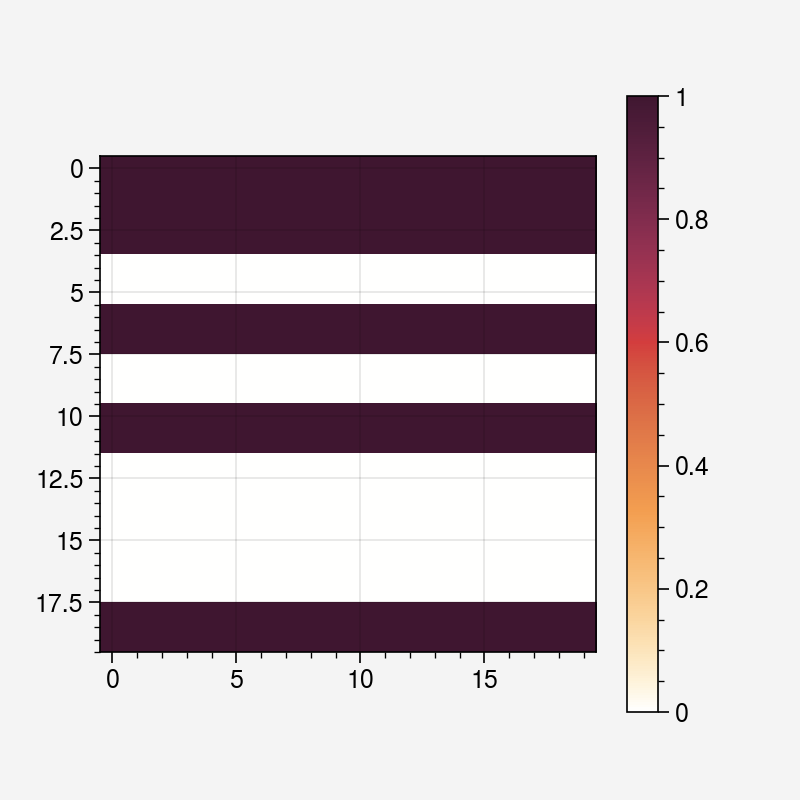

In [103]:

plt.imshow(np.array(cos_sim_grad(grads['value'], comb_grad, pairwise=False)).reshape(-1, 20))
plt.colorbar()

In [101]:
cs = cos_sim_grad(grads['value'], comb_grad, pairwise=False)

In [111]:
plot_grad_type = 'value'
xs = []
ys = []

for batch in batch_sizes:
    chks = all_chks[batch]

    for chk in chks:
        for trial in range(num_trials):
            grads = all_res[batch][aux][trial][chk]['all_grads']
            #Compute combined RL gradient vectors
            comb_grad = grads['value'].copy()
            for layer in range(len(grads['value'])):
                for n in range(len(grads['value'][layer])):
                    comb_grad[layer][n] = torch.zeros(comb_grad[layer][n].shape)

            for layer in range(len(grads['value'])):
                for n in range(len(grads['value'][layer])):
                    for grad_type in rl_grad_types:
                        comb_grad[layer][n] += grads[grad_type][layer][n]

            #Compute similarity with each individual gradient type
            cs = np.array(cos_sim_grad(grads[plot_grad_type], comb_grad, pairwise=False)).reshape(-1, 20)
            filt_cs = list(cs[use_layers].reshape(-1))
            ys += filt_cs
            xs += [chk*batch*200]*len(filt_cs)

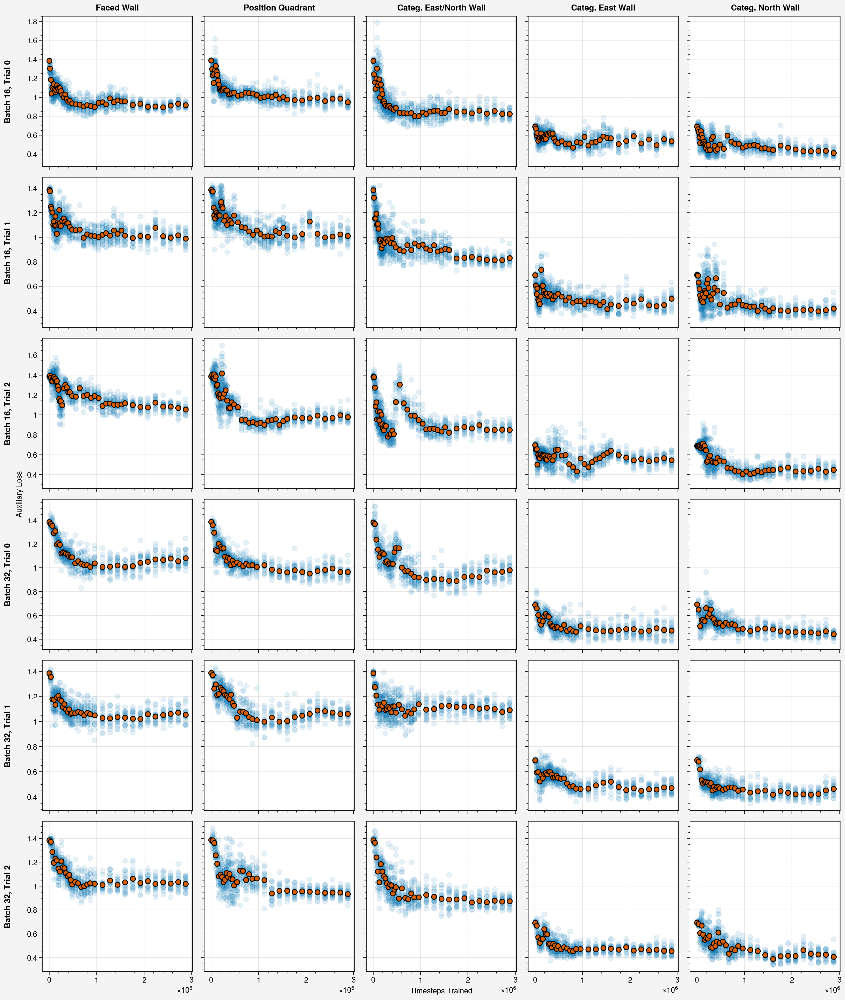

In [23]:
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

num_trials = 3
fig, ax = pplt.subplots(nrows=len(batch_sizes), ncols=len(aux_tasks))

for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        chks = all_chks[batch]
        for trial in range(num_trials):
            x = []
            y = []
            x_means = []
            y_means = []
            for chk in chks:
                losses = all_res[batch][aux][trial][chk]['auxiliary_losses']
                timestep = chk*batch*100
                x += [timestep]*len(losses)
                y += losses
                x_means.append(timestep)
                y_means.append(np.mean(losses))
                
            ax[i*num_trials+trial, j].scatter(x, y, alpha=0.1)
            scatters = [ax[i*num_trials+trial, j].scatter(x_means, y_means, edgecolor='black', linewidth=1,
                        label='mean')]
            
leftlabels = []
for i, batch in enumerate(batch_sizes):
    for trial in range(num_trials):
        leftlabels.append(f'Batch {batch}, Trial {trial}')
ax.format(toplabels=aux_labels, leftlabels=leftlabels, xlabel='Timesteps Trained',
         ylabel='Auxiliary Loss')


# Debugging DecomposeGradPPOAux

In [ ]:
collect_batch = 128
collect_processes = 4

"""Set up storage object
"""
batch_sizes = [16, 32]
aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
auxiliary_truth_sizes = [[1], [1], [1, 1],  [1], [1]]
trials = range(3)
all_chks = {16: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900, 950, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800],
            32: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
        170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
        650, 700, 750, 800, 850, 900]}


all_res = {}

for i, batch in enumerate(batch_sizes):
    all_res[batch] = {}
    for aux in aux_tasks:
        all_res[batch][aux] = {}
        for trial in trials:
            all_res[batch][aux][trial] = {}
            
            

for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        for trial in trials:
            exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'
            exp_name_t = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}_t{trial}'
            
            # _, _, env_kwargs = load_model_and_env(exp_name, 0)
            env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
            chk_path = Path('../trained_models/checkpoint/')/exp_name_t
            chks = all_chks[batch]
            

            #Load first checkpoint and warm up reward normalization
            model, obs_rms = torch.load(chk_path/f'{chks[0]}.pt')
            agent, envs, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                                    num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                                          agent_base='DecomposeGradPPOAux', new_aux=True,
                                                           auxiliary_truth_sizes=auxiliary_truth_sizes[j])
            obs = storage.obs[0].clone()
            res = collect_batches_and_grads(agent, envs, storage, 50, decompose_grads=True, new_aux=True)


            cs_means = []
            for chk in tqdm(chks):
                model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                obs = storage.obs[-1].clone()
                envs.venv.obs_rms = obs_rms
                agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                                        num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                                        make_env=False, obs=obs, agent_base='DecomposeGradPPOAux', new_aux=True, 
                                                            auxiliary_truth_sizes=auxiliary_truth_sizes[j])


                res = collect_batches_and_grads(agent, envs, storage, num_batches=20,
                                                data_callback=nav_data_callback, decompose_grads=True,
                                                new_aux=True)
                all_res[batch][aux][trial][chk] = res
                
            

        pickle.dump(all_res, open(f'data/grads/auxcat_grads', 'wb'))


In [205]:
collect_batch = 128
collect_processes = 4
aux_task = 'catfacewall'
batch = 16
trial = 0

chk = 100
auxiliary_truth_sizes = [1]

exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'
exp_name_t = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}_t{trial}'

# _, _, env_kwargs = load_model_and_env(exp_name, 0)
env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
chk_path = Path('../trained_models/checkpoint/')/exp_name_t
chks = all_chks[batch]


#Load first checkpoint and warm up reward normalization
model, obs_rms = torch.load(chk_path/f'{chks[0]}.pt')
agent, envs, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                        num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                              agent_base='DecomposeGradPPOAux', new_aux=True,
                                               auxiliary_truth_sizes=auxiliary_truth_sizes)
obs = storage.obs[0].clone()
res = collect_batches_and_grads(agent, envs, storage, 50, decompose_grads=True, new_aux=True)


cs_means = []


model, obs_rms = torch.load(chk_path/f'{chk}.pt')
obs = storage.obs[-1].clone()
envs.venv.obs_rms = obs_rms
agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                        num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                        make_env=False, obs=obs, agent_base='DecomposeGradPPOAux', new_aux=True, 
                                            auxiliary_truth_sizes=auxiliary_truth_sizes)


res = collect_batches_and_grads(agent, envs, storage, num_batches=20,
                                data_callback=nav_data_callback, decompose_grads=True,
                                new_aux=True)
# all_res[batch][aux][trial][chk] = res

IndexError: list index out of range

In [206]:
model, obs_rms = torch.load(chk_path/f'{chk}.pt')
obs = storage.obs[-1].clone()
envs.venv.obs_rms = obs_rms
agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                                        num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                        make_env=False, obs=obs, agent_base='DecomposeGradPPOAux', new_aux=True, 
                                            auxiliary_truth_sizes=auxiliary_truth_sizes)


res = collect_batches_and_grads(agent, envs, storage, num_batches=20,
                                data_callback=nav_data_callback, decompose_grads=True,
                                new_aux=True)


In [217]:
grads = res['all_grads']
v_grads = grads['value']

norm_1 = []
norm_2 = []
norm_3 = []
for layer in range(len(v_grads)):
    for n in range(20):
        comb_grad = grads['value'][layer][n] + grads['action'][layer][n] + grads['entropy'][layer][n]
        norm_1.append(torch.norm(comb_grad).item())
        norm_2.append(torch.norm(comb_grad - grads['value'][layer][n]).item())
        norm_3.append(torch.norm(grads['value'][layer][n] - grads['action'][layer][n] - grads['entropy'][layer][n]).item())

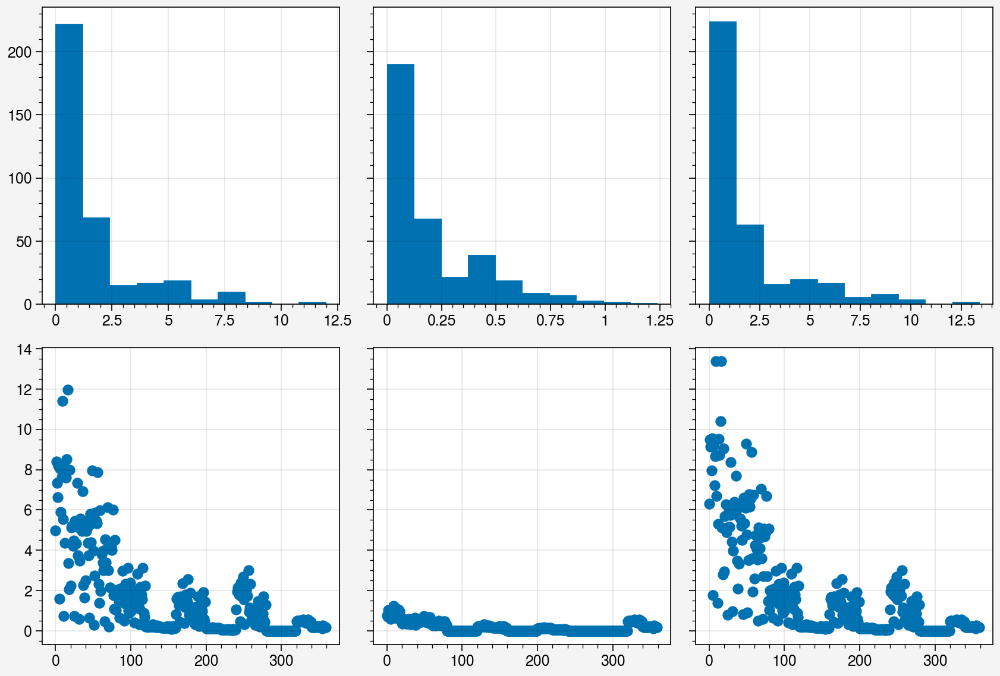

In [304]:
fig, ax = pplt.subplots(ncols=3, nrows=2, sharex=False)
ax[0, 0].hist(norm_1)
ax[0, 1].hist(norm_2)
ax[0, 2].hist(norm_3)

ax[1, 0].scatter(np.arange(len(norm_1)), norm_1)
ax[1, 1].scatter(np.arange(len(norm_2)), norm_2)
ax[1, 2].scatter(np.arange(len(norm_3)), norm_3)

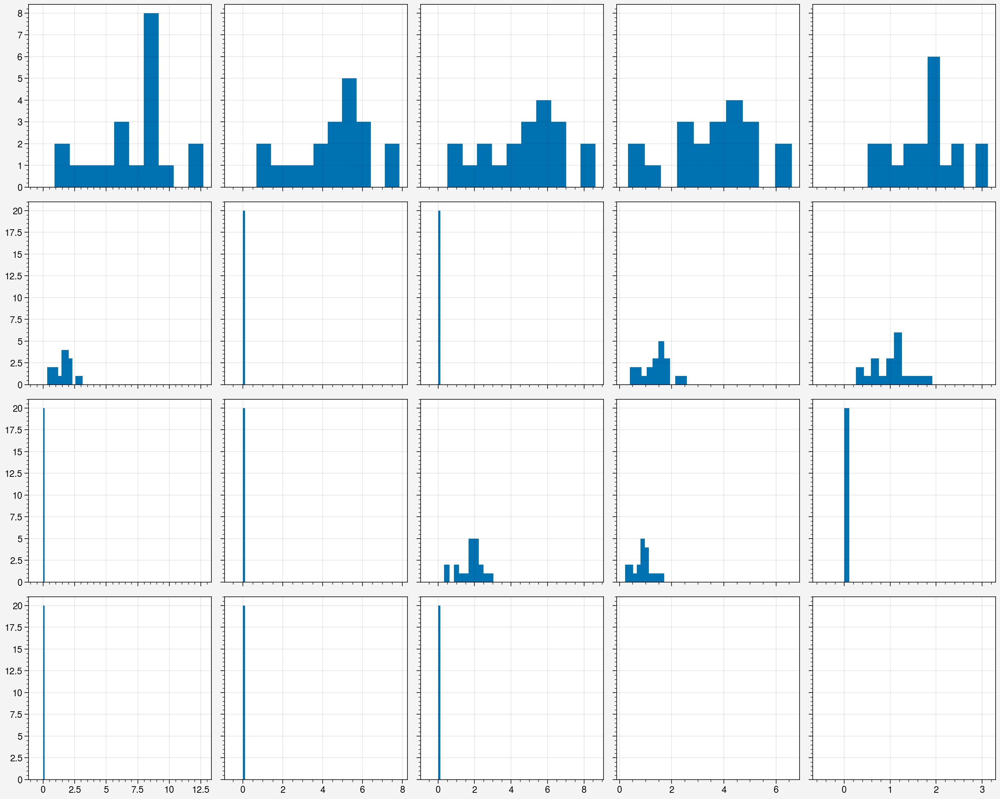

In [221]:
fig, ax = pplt.subplots(nrows=4, ncols=5)
for i, layer_grads in enumerate(grads['value']):
    norms = []
    for g in layer_grads:
        norms.append(torch.norm(g).item())
    ax[i].hist(norms)
    
# grads['value']

In [228]:
params = list(agent.actor_critic.parameters())

In [231]:
params[0].grad = torch.zeros(params[0].grad.shape)

In [232]:
params[0].grad

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [293]:
num_mini_batch = agent.num_mini_batch
ppo_epoch = agent.ppo_epoch
clip_param = agent.clip_param
use_clipped_value_loss = agent.use_clipped_value_loss
optimizer = agent.optimizer
auxiliary_loss_coef = agent.auxiliary_loss_coef
entropy_coef = agent.entropy_coef
value_loss_coef = agent.value_loss_coef
max_grad_norm = agent.max_grad_norm

actor_critic = agent.actor_critic
auxiliary_types = agent.auxiliary_types
cross_entropy_loss = nn.CrossEntropyLoss() #used for multiclass aux loss

remove_actor_grads_on_shared_batch = False


advantages = storage.returns[:-1] - storage.value_preds[:-1]
advantages = (advantages - advantages.mean()) / (
    advantages.std() + 1e-5)

value_loss_epoch = 0
action_loss_epoch = 0
dist_entropy_epoch = 0
auxiliary_loss_epoch = 0

clipfracs = []
explained_vars = []
for e in range(ppo_epoch):
    if actor_critic.is_recurrent:
        data_generator = storage.recurrent_generator(
            advantages, num_mini_batch)
    else:
        data_generator = storage.feed_forward_generator(
            advantages, num_mini_batch)

    for sample in data_generator:
        obs_batch, recurrent_hidden_states_batch, actions_batch, \
            value_preds_batch, return_batch, masks_batch, old_action_log_probs_batch, \
            adv_targ, auxiliary_pred_batch, auxiliary_truth_batch = sample

        # Reshape to do in a single forward pass for all steps
        values, action_log_probs, dist_entropy, _, auxiliary_preds = actor_critic.evaluate_actions(
            obs_batch, recurrent_hidden_states_batch, masks_batch,
            actions_batch)

        logratio = action_log_probs - old_action_log_probs_batch 
        ratio = torch.exp(logratio)
        surr1 = ratio * adv_targ
        surr2 = torch.clamp(ratio, 1.0 - clip_param,
                            1.0 + clip_param) * adv_targ
        action_loss = -torch.min(surr1, surr2).mean()

        #Andy: compute approx kl
        with torch.no_grad():
            # old_approx_kl = (-logratio).mean()
            approx_kl = ((ratio - 1) - logratio).mean()
            clipfracs += [
                ((ratio - 1.0).abs() > clip_param).float().mean().item()
            ]

        if use_clipped_value_loss:
            value_pred_clipped = value_preds_batch + \
                (values - value_preds_batch).clamp(-clip_param, clip_param)
            value_losses = (values - return_batch).pow(2)
            value_losses_clipped = (
                value_pred_clipped - return_batch).pow(2)
            value_loss = 0.5 * torch.max(value_losses,
                                            value_losses_clipped).mean()
        else:
            value_loss = 0.5 * (return_batch - values).pow(2).mean()
        
        if actor_critic.has_auxiliary:
            # auxiliary_loss = torch.tensor(0.)
            auxiliary_losses = torch.zeros(len(auxiliary_types))
            for i, aux_type in enumerate(auxiliary_types):
                if aux_type == 0:
                    # auxiliary_loss += 0.5 * (auxiliary_truth_batch[i] - auxiliary_preds[i]).pow(2).mean()
                    auxiliary_losses[i] += 0.5 * (auxiliary_truth_batch[i] - auxiliary_preds[i]).pow(2).mean()
                elif aux_type == 1:
                    # auxiliary_loss += cross_entropy_loss(auxiliary_preds[i], auxiliary_truth_batch[i])
                    auxiliary_losses[i] += cross_entropy_loss(auxiliary_preds[i], auxiliary_truth_batch[i].long().squeeze())
            auxiliary_loss = auxiliary_losses.sum()
        else:
            auxiliary_loss = torch.zeros(1)

        if remove_actor_grads_on_shared_batch:
            optimizer.zero_grad()
            # First get gradient of everything except for value loss
            (action_loss + 
            auxiliary_loss * auxiliary_loss_coef -
            dist_entropy * entropy_coef).backward(retain_graph=True)
            params = list(actor_critic.parameters())
            # Zero out first 4 param sets, as these are the shared layers
            for i in range(4):
                params[i].grad = torch.zeros(params[i].shape)
            (value_loss * value_loss_coef).backward()
            nn.utils.clip_grad_norm_(actor_critic.parameters(),
                                     max_grad_norm)
            # optimizer.step()
        else:
            optimizer.zero_grad()
            (value_loss * value_loss_coef + action_loss + 
            auxiliary_loss * auxiliary_loss_coef -
            dist_entropy * entropy_coef).backward()
            nn.utils.clip_grad_norm_(actor_critic.parameters(),
                                    max_grad_norm)
            # optimizer.step()

        value_loss_epoch += value_loss.item()
        action_loss_epoch += action_loss.item()
        dist_entropy_epoch += dist_entropy.item()
        auxiliary_loss_epoch += auxiliary_loss.item()

In [264]:
params = list(actor_critic.parameters())

In [288]:
params[0].grad

tensor([[ 3.6039e-04,  3.2902e-04,  3.8835e-04,  ..., -4.4856e-04,
         -6.1675e-04, -6.2399e-04],
        [ 2.4669e-04,  2.6042e-04,  2.8219e-04,  ...,  1.4469e-04,
          1.4696e-04,  1.7078e-04],
        [-2.7577e-04,  2.6263e-04,  1.3395e-04,  ...,  2.2299e-03,
          1.7425e-03,  1.4829e-03],
        ...,
        [-3.9258e-03, -3.6918e-03, -2.8727e-03,  ...,  1.3259e-02,
          1.2129e-02,  1.0681e-02],
        [ 1.0426e-02,  1.0955e-02,  8.4856e-03,  ..., -2.8922e-03,
         -2.3795e-05,  2.9588e-03],
        [-1.5734e-02, -1.5126e-02, -9.3611e-03,  ...,  1.7335e-03,
         -2.0593e-03, -4.0671e-03]])

In [289]:
params[5].grad

tensor([ 0.0154,  0.0213,  0.0111, -0.0007, -0.0396, -0.0061, -0.0017,  0.0373,
         0.0132,  0.0167,  0.0105,  0.0108,  0.0240,  0.0044,  0.0013,  0.0348])

In [ ]:
params[0].grad

tensor([[ 3.0929e-04,  2.3595e-04,  3.0093e-04,  ..., -1.0935e-04,
         -3.0609e-04, -3.2834e-04],
        [ 2.6363e-04,  2.8739e-04,  3.1283e-04,  ...,  1.1765e-04,
          1.0083e-04,  9.7692e-05],
        [-1.5258e-03, -6.3899e-04,  2.6567e-04,  ...,  1.9532e-03,
          1.4553e-03,  1.2258e-03],
        ...,
        [-5.5683e-03, -3.0451e-03, -5.8845e-04,  ...,  1.4878e-02,
          1.3993e-02,  1.2564e-02],
        [ 1.0671e-02,  1.2074e-02,  9.5186e-03,  ..., -1.0770e-03,
          1.8715e-03,  4.9214e-03],
        [-1.3174e-02, -1.2101e-02, -6.0480e-03,  ...,  1.3773e-03,
         -3.7147e-03, -6.5123e-03]])

In [ ]:
params[5].grad

tensor([ 0.0167,  0.0231,  0.0120, -0.0008, -0.0428, -0.0066, -0.0018,  0.0404,
         0.0143,  0.0180,  0.0114,  0.0116,  0.0260,  0.0048,  0.0015,  0.0376])

In [297]:
params[0].grad

tensor([[ 3.6039e-04,  3.2902e-04,  3.8835e-04,  ..., -4.4856e-04,
         -6.1675e-04, -6.2399e-04],
        [ 2.4669e-04,  2.6042e-04,  2.8219e-04,  ...,  1.4469e-04,
          1.4696e-04,  1.7078e-04],
        [-2.7577e-04,  2.6264e-04,  1.3395e-04,  ...,  2.2299e-03,
          1.7425e-03,  1.4829e-03],
        ...,
        [-3.9258e-03, -3.6918e-03, -2.8727e-03,  ...,  1.3259e-02,
          1.2129e-02,  1.0681e-02],
        [ 1.0426e-02,  1.0955e-02,  8.4856e-03,  ..., -2.8922e-03,
         -2.3795e-05,  2.9588e-03],
        [-1.5734e-02, -1.5126e-02, -9.3611e-03,  ...,  1.7335e-03,
         -2.0593e-03, -4.0671e-03]])

In [298]:
params[5].grad

tensor([ 0.0154,  0.0213,  0.0111, -0.0007, -0.0396, -0.0061, -0.0017,  0.0373,
         0.0132,  0.0167,  0.0105,  0.0108,  0.0240,  0.0044,  0.0013,  0.0348])

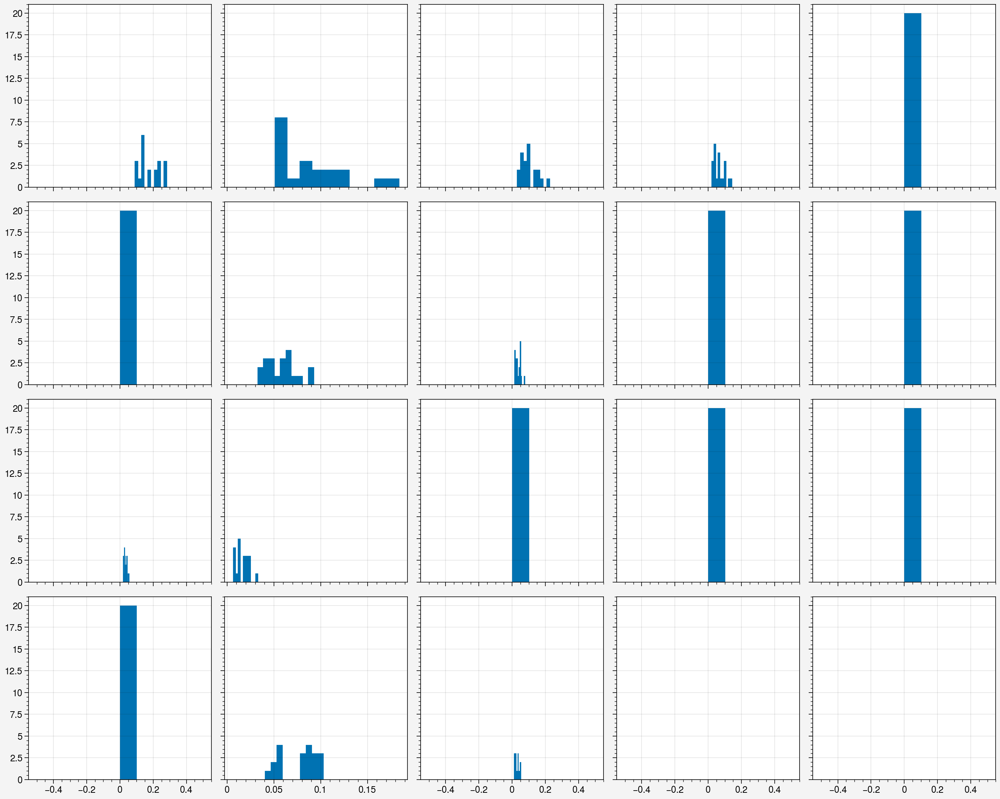

In [222]:
fig, ax = pplt.subplots(nrows=4, ncols=5)
for i, layer_grads in enumerate(grads['action']):
    norms = []
    for g in layer_grads:
        norms.append(torch.norm(g).item())
    ax[i].hist(norms)
    
# grads['value']

In [208]:
res['all_grads']['entropy'][0][0]

tensor([[-9.6672e-04, -1.4371e-03, -1.5041e-03,  ...,  5.8948e-03,
          5.6227e-03,  4.8881e-03],
        [ 8.1293e-04,  9.8231e-04,  9.7693e-04,  ...,  4.4448e-04,
          2.3265e-04,  9.5952e-05],
        [-4.4507e-03,  1.8594e-04,  1.2991e-03,  ..., -3.4041e-03,
         -3.5700e-03, -3.5457e-03],
        ...,
        [-1.0536e-02, -9.8270e-03, -6.9583e-03,  ..., -1.3436e-02,
         -1.1205e-02, -9.3787e-03],
        [-2.2102e-02, -2.3525e-02, -2.6772e-02,  ...,  2.0524e-02,
          1.7372e-02,  1.7023e-02],
        [ 4.0200e-02,  4.1622e-02,  4.3180e-02,  ..., -5.5362e-02,
         -5.8471e-02, -5.9537e-02]])

In [210]:
res['all_grads']['action'][0][0] + res['all_grads']['entropy'][0][0]

tensor([[-1.1005e-03, -1.5571e-03, -1.6264e-03,  ...,  6.3293e-03,
          6.0273e-03,  5.3108e-03],
        [ 8.5431e-04,  1.0310e-03,  1.0216e-03,  ...,  1.6134e-04,
         -6.8994e-05, -2.4398e-04],
        [-4.3949e-03,  1.4941e-04,  1.2817e-03,  ..., -3.2253e-03,
         -3.3452e-03, -3.3523e-03],
        ...,
        [-6.4140e-03, -5.5645e-03, -2.7796e-03,  ..., -1.0285e-02,
         -9.5646e-03, -7.5953e-03],
        [-2.1288e-02, -2.1672e-02, -2.5126e-02,  ...,  1.3009e-02,
          9.7858e-03,  1.0388e-02],
        [ 4.1012e-02,  4.2408e-02,  4.3859e-02,  ..., -5.5529e-02,
         -5.7998e-02, -5.8762e-02]])